#### Python script to create the figures for 

### An improved model of particle attenuation reduces estimates of Southern Ocean carbon transfer efficiency
*************************************

**Software requirements:**

3.11.14 | packaged by conda-forge | (main, Oct 22 2025, 22:46:25) [GCC 14.3.0]

requires about 5GB of Memory

**Input files:**
- Statistics from bpl/spl curve fit, Monte Carlo: *stats_df.pkl*
- seleted FLoat data (intepolated, QC'd): *master_floats.nc*
- monthyl, zonal averaged data: *monthly.nc*
**************************************
A. Oetjens, November 2025

annika.oetjens@utas.edu.au


In [1]:
# Load modules (not all of them might be necessary)
import sys 
import os

import h5py
import dask
import glob
import xarray as xr
import numpy as np
import pandas as pd
from pandas.plotting import register_matplotlib_converters
import seaborn as sns
import cmocean
#import gsw
# MATPLOTLIB
import matplotlib.pyplot as plt
from matplotlib import cm, ticker
from matplotlib import colors as clrs 
from matplotlib.ticker import LogFormatter 
import matplotlib.path as mpath
from matplotlib.patches import Patch, Rectangle
from matplotlib.colors import ListedColormap
# CARTOPY
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature



# path to where the datafiles live
path = '/../../../g/data/jk72/ao2582/FOSOR/data/'
sys.path.append(os.path.abspath(path))
# show files in folder
print(glob.glob(path + '*'))

# set plotting styles
plt.rc("font", size=14)
register_matplotlib_converters()
sns.set_style("white")


['/../../../g/data/jk72/ao2582/FOSOR/data/BGC_argo_processed.nc', '/../../../g/data/jk72/ao2582/FOSOR/data/ds_cbpm_TE.nc', '/../../../g/data/jk72/ao2582/FOSOR/data/stats_df.pkl']


In [2]:
# load files
df_poc = pd.read_pickle(path +'stats_df.pkl')
# mask Southen Zone
df_results = df_poc[df_poc['Zone']!='sz']

ds_floats = xr.open_dataset(path + 'BGC_argo_processed.nc')
ds_cbpm = xr.open_dataset(path + 'ds_cbpm_TE.nc')





/g/data/xp65/public/apps/med_conda/envs/analysis3-25.10/lib/python3.11/site-packages/distributed/diagnostics/nvml.py:14: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml


In [3]:
# process SSH satellite data


path_ssh =  '/../../../g/data/jk72/ao2582/AVISO/'# point to AVISO monthly climatology of SSH

# Path to AVISO MADT files
file_list = sorted(glob.glob(path_ssh + '*_madt_*_m*.nc'))
    
# Function to load and clean each dataset
def preprocess(ds):
    # Drop 'nv' dimension if it exists
    ds = ds.drop_dims('nv', errors='ignore')
    return ds
    
# Open all files as a single xarray.Dataset along the time dimension
ds_all = xr.open_mfdataset(file_list, 
                            concat_dim='time', 
                            combine='nested', 
                            preprocess=preprocess)
    
ds_all = ds_all.rename({'time': 'month'})
ds_all = ds_all.assign_coords(month=np.arange(1, len(ds_all.month) + 1))
# Confirm structure
print(ds_all)
    
# drop data above 40South
ds_ssh = ds_all.where(ds_all.latitude < -40, drop=True)
    
# shuffle longitude to -180 to 180
ds_ssh = ds_ssh.assign_coords(
    longitude=(((ds_ssh.longitude + 180) % 360) - 180)).sortby('longitude')
    
    
# create mask from ssh contour regions
levs = [-1.1, -0.65, -0.1, 1]  # ssh
az_mask = (ds_ssh.adt >= -1.1) & (ds_ssh.adt < -0.65)& (ds_ssh.latitude > -70)
pfz_mask = (ds_ssh.adt >= -0.65) & (ds_ssh.adt < -0.1)& (ds_ssh.latitude > -70)
saz_mask = (ds_ssh.adt >= -0.1) & (ds_ssh.latitude < -40) & (ds_ssh.latitude > -70)
    
# match grid to carbon data
ssh_interp = ds_ssh.adt.interp(
    latitude=ds_cbpm.lat,
    longitude=ds_cbpm.lon,
    method="nearest")
    

# Antarctic Zone
az_mask = (ssh_interp >= -1.1) & (ssh_interp < -0.65)& (ssh_interp.latitude > -70)
# Polar Frontal Zone
pfz_mask = (ssh_interp >= -0.65) & (ssh_interp < -0.1)& (ssh_interp.latitude > -70)
#Sub Antarctic Zone
saz_mask = (ssh_interp >= -0.1) & (ssh_interp.latitude < -40) & (ssh_interp.latitude > -70)





<xarray.Dataset> Size: 100MB
Dimensions:    (month: 12, latitude: 720, longitude: 1440)
Coordinates:
  * month      (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
  * latitude   (latitude) float32 3kB -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * longitude  (longitude) float32 6kB 0.125 0.375 0.625 ... 359.4 359.6 359.9
Data variables:
    crs        (month) int32 48B -2147483647 -2147483647 ... -2147483647
    adt        (month, latitude, longitude) float64 100MB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
Attributes: (12/38)
    cdm_data_type:                   Grid
    date_issued:                     2022-06-23 16:18:53Z
    time_coverage_resolution:        P1M
    creator_email:                   aviso@altimetry.fr
    product_version:                 7.0
    references:                      www.aviso.altimetry.fr
    ...                              ...
    geospatial_vertical_min:         0.0
    geospatial_vertical_max:         0.0
    geospatial_lat_units:            

/jobfs/155443836.gadi-pbs/ipykernel_1805580/906349768.py:16: FutureWarning: In a future version of xarray the default value for data_vars will change from data_vars='all' to data_vars=None. This is likely to lead to different results when multiple datasets have matching variables with overlapping values. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set data_vars explicitly.
  ds_all = xr.open_mfdataset(file_list,


In [5]:
# compute zonal averages and store in easily accessible dataset

sinking = 20  # m/day
days = 30     # avg days per month
# keep lat lon
export_bpl_so = (ds_cbpm.TE_bpl * ds_cbpm.tot_carbon) * sinking * 30 # days in a month
export_spl_so = (ds_cbpm.TE_spl * ds_cbpm.tot_carbon) * sinking * 30 # days in a month

# apply regional masks to compute regional Export
press = np.array([20,50,70,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000])
region_export_data = {}
depths = press
print(press)
# create a mask to group TE values in the sub regions
lon = ds_cbpm.lon  # shape: [lon]

zones = {'az': az_mask, 'pfz': pfz_mask, 'saz': saz_mask}
basins = {'atl': 1, 'ind': 2, 'pac': 3}

basin_mask = xr.DataArray(
    data=np.full((len(lon)), np.nan),
    coords={'lon': lon},
    dims=['lon']
)


# Assign numeric labels (you can use strings too if you prefer)
basin_mask = xr.where((lon >= -60) & (lon <= 40), 1, basin_mask)     # SOATLANTIC
basin_mask = xr.where((lon >= 40) & (lon <= 180), 2, basin_mask)     # SOINDIAN
basin_mask = xr.where((lon >= -180) & (lon < -60), 3, basin_mask)    # SOPACIFIC

basin_mask_3d = basin_mask.broadcast_like(ds_cbpm.carbon)
zone_basin_masks = {}

for zname, zmask in zones.items():
    for bname, bid in basins.items():
        combined = zmask & (basin_mask_3d == bid)
        zone_basin_masks[f"{zname}_{bname}"] = combined

for region_name, mask in zone_basin_masks.items():
    region_mask = mask
    region_export_data[region_name] = {}
    export_bpl = export_bpl_so.where(region_mask).sum(dim=('lat', 'lon', 'month')).compute().data
    export_spl = export_spl_so.where(region_mask).sum(dim=('lat', 'lon', 'month')).compute().data

    anomaly = export_spl - export_bpl

    region_export_data[region_name] = {
            'BPL': export_bpl,
            'SPL': export_spl,
            'Anomaly': anomaly,
            'depth' : depths}

regions = {
    'az_atl':  ('az', 'SOATLANTIC'),
    'az_ind':  ('az', 'SOINDIAN'),
    'az_pac':  ('az', 'SOPACIFIC'),
    'pfz_atl':  ('pfz', 'SOATLANTIC'),
    'pfz_ind':  ('pfz', 'SOINDIAN'),
    'pfz_pac':  ('pfz', 'SOPACIFIC'),
    'saz_atl': ('saz', 'SOATLANTIC'),
    'saz_ind': ('saz', 'SOINDIAN'),
    'saz_pac': ('saz', 'SOPACIFIC'),
}

###########################################################################
###########################################################################

# build dataset with sector MEAN and monthly/summer mean POC profiles, b values and TE rates

# initialise empty Dataset and lists to store sector data
ds_zones = xr.Dataset({})
TE_bpl_list = []
TE_spl_list = []
b1_region_list = []
b2_region_list = []
b_region_list = []
cs_region_list = []
cd_region_list = []
z_prod_region_list = []
z_trans_region_list = []
poc_region_list = []

pres_levels = ds_floats.pressure


for region_name, (zone_name, basin_name) in regions.items():
    TE_region_1  = np.ones((len(pres_levels),0))
    TE_region_2  = np.ones((len(pres_levels),0))
    print(region_name, zone_name, basin_name)
    # Filter float profiles for this region
    mask_floats =  (ds_floats['zone'].isin([zone_name])) & (ds_floats['sonif'].isin([basin_name])) 
    b1_region = ds_floats.Par_b1_k.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    b2_region = ds_floats.Par_b2_k.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    b_region = ds_floats.Par_b_k.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    cd_region = ds_floats.Par_cd_k.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    cs_region = ds_floats.Par_cs_k.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    z_prod_region = ds_floats.z_prod.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    z_trans_region = ds_floats.Par_z_k.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')
    poc_region = ds_floats.poc_koest_bc.isel(n_prof=mask_floats).groupby('time.month').mean(dim='n_prof')

    for mon in b1_region.month:
        b1 = b1_region.sel(month=mon)
        b2 = b2_region.sel(month=mon)
        b = b_region.sel(month=mon)
        z_prod = z_prod_region.sel(month=mon)
        z_trans = z_trans_region.sel(month=mon)    
        levs = pres_levels #ds_floats.pressure
    
        te1 = np.where(levs > z_prod, np.where(levs < z_trans, (levs / z_prod) ** (-b1), (z_trans / z_prod) ** (-b1) * (levs / z_trans) ** (-b2)), 1)  
        te2 =  np.where(levs > z_prod, (levs / z_prod) ** (-b), 1)

        TE_region_1 = np.c_[TE_region_1, te1]
        TE_region_2 = np.c_[TE_region_2, te2]


    TE_bpl = xr.DataArray(TE_region_1,
    dims=[ "pressure", "month"],
    coords={"month": np.arange(1,13,1), "pressure":levs})
    TE_spl = xr.DataArray(TE_region_2,
    dims=[ "pressure", "month"],
    coords={"month": np.arange(1,13,1), "pressure": levs})
    

    TE_bpl_list.append(TE_bpl.expand_dims(region=[region_name]))
    TE_spl_list.append(TE_spl.expand_dims(region=[region_name]))
    b1_region_list.append(b1_region.expand_dims(region=[region_name]))
    b2_region_list.append(b2_region.expand_dims(region=[region_name]))
    b_region_list.append(b_region.expand_dims(region=[region_name]))
    cs_region_list.append(cs_region.expand_dims(region=[region_name]))
    cd_region_list.append(cd_region.expand_dims(region=[region_name]))
    z_prod_region_list.append(z_prod_region.expand_dims(region=[region_name]))
    z_trans_region_list.append(z_trans_region.expand_dims(region=[region_name]))
    poc_region_list.append(poc_region.expand_dims(region=[region_name]))

# Concatenate along region
TE_bpl_all = xr.concat(TE_bpl_list, dim="region")
TE_spl_all = xr.concat(TE_spl_list, dim="region")
b1_all = xr.concat(b1_region_list, dim="region")
b2_all = xr.concat(b2_region_list, dim="region")
b_all = xr.concat(b_region_list, dim="region")
cs_all = xr.concat(cs_region_list, dim="region")
cd_all = xr.concat(cd_region_list, dim="region")
z_prod_all = xr.concat(z_prod_region_list, dim="region")
z_trans_all = xr.concat(z_trans_region_list, dim="region")
poc_all = xr.concat(poc_region_list, dim="region")

ds_zones['TE_bpl'] = (TE_bpl_all)
ds_zones['TE_spl'] = (TE_spl_all)
ds_zones['b1_bpl'] = (b1_all)
ds_zones['b2_bpl'] = (b2_all)
ds_zones['b_spl'] = (b_all)
ds_zones['cd_bpl'] = (cd_all)
ds_zones['cs_spl'] = (cs_all)
ds_zones['z_prod'] = (z_prod_all)
ds_zones['z_trans'] = (z_trans_all)
ds_zones['poc'] = (poc_all)


print('-----   DONE') 

[  20   50   70  100  150  200  250  300  350  400  450  500  550  600
  650  700  750  800  850  900  950 1000]
az_atl az SOATLANTIC
az_ind az SOINDIAN
az_pac az SOPACIFIC
pfz_atl pfz SOATLANTIC
pfz_ind pfz SOINDIAN
pfz_pac pfz SOPACIFIC
saz_atl saz SOATLANTIC
saz_ind saz SOINDIAN
saz_pac saz SOPACIFIC
-----   DONE


## Figure 1

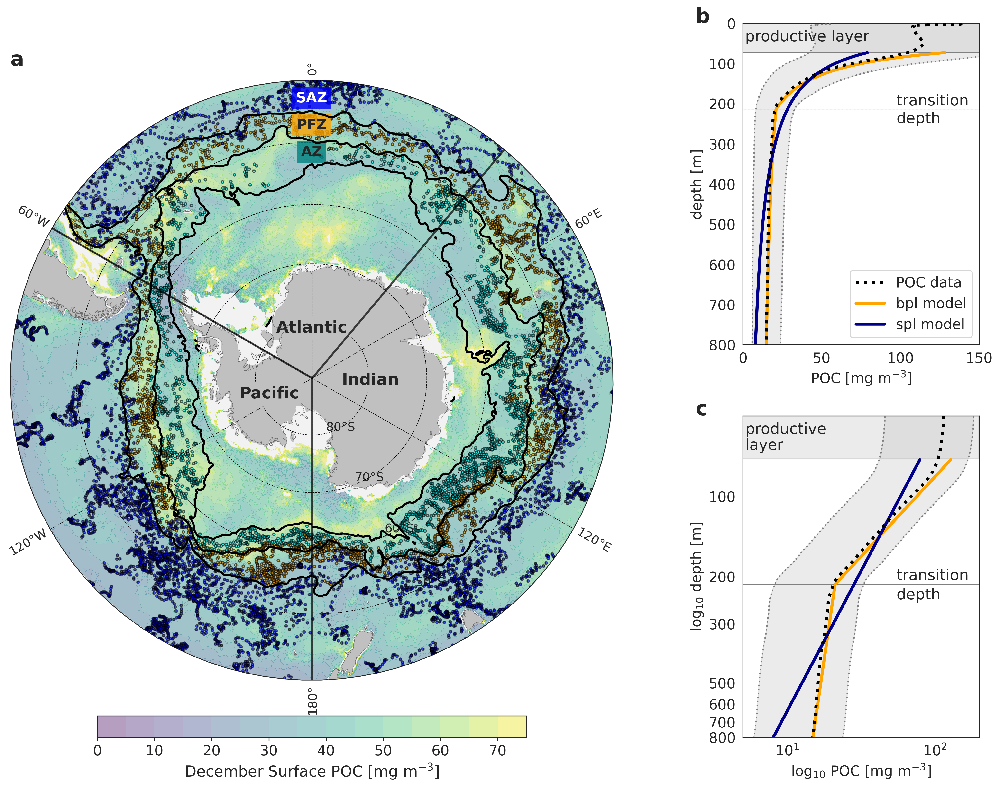

In [6]:
# Broken power law
def bpl(x, b1, b2, cd, z_trans, zprod):
    return np.where(x>zprod ,np.where(x < z_trans, (x/z_trans)**(-b1) * cd, (x/z_trans)**(-b2) * cd), np.nan)
# Simple power law
def spl(x, b, cs, zprod):
    return np.where(x>zprod ,(x/zprod)**(-b) * cs, np.nan)

# read in data for each zone
mask = (ds_floats['zone'].isin(['az']))# &  (ds_floats['month'].isin([1,2,12]))
ds = ds_floats.isel(n_prof=mask)
lons_az, lats_az = ds.lon, ds.lat

mask = (ds_floats['zone'].isin(['pfz']))# &  (ds_floats['month'].isin([1,2,12]))
ds = ds_floats.isel(n_prof=mask)
lons_pfz, lats_pfz = ds.lon, ds.lat

mask = (ds_floats['zone'].isin(['saz']))# &  (ds_floats['month'].isin([1,2,12]))
ds = ds_floats.isel(n_prof=mask)
lons_saz, lats_saz = ds.lon, ds.lat


zone_colors = ['cyan', 'cyan', 'orange', 'orange', 'darkblue']
zone_map = ListedColormap(zone_colors)


extent=[-180,180,-90,-40]


# initialise Figure
fig = plt.figure(figsize=(14, 11), dpi=300)

ax =  plt.subplot2grid((2, 3), (0, 0), projection=ccrs.SouthPolarStereo(), colspan=2, rowspan=2)
ax2 = plt.subplot2grid((2, 3), (0, 2), colspan=1, rowspan=1)
ax3 = plt.subplot2grid((2, 3), (1, 2), colspan=1, rowspan=1)

#####################################################
#####################################################

theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])
#ax = plt.axes(projection=ccrs.SouthPolarStereo())
ax.set_extent(extent, ccrs.PlateCarree())
ax.set_facecolor([0.95, 0.95, 0.95])
ax.coastlines(resolution = "50m",zorder = 16, linewidth = 0.4, color='dimgrey')
ax.add_feature(cfeature.LAND, color='silver', lw=0.3, zorder=1) #cfeature.COLORS['land_alt1']
ax.set_boundary(map_circle, transform=ax.transAxes)
gl = ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', color='black', alpha=1, zorder=20)
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}

# plot float profiles
ax.scatter(lons_az, lats_az,c='cyan',marker='o',edgecolor='black',s=6, zorder=11,transform=ccrs.PlateCarree(), alpha = 0.6, label='Antarctic Zone')  
ax.scatter(lons_pfz, lats_pfz,c='orange',marker='o',edgecolor='black',s=6, zorder=11,transform=ccrs.PlateCarree(), alpha = 0.6, label = 'Polar Frontal Zone')  
ax.scatter(lons_saz, lats_saz,c='blue',marker='o',edgecolor='black',s=6, zorder=11,transform=ccrs.PlateCarree(), alpha = 0.6, label = 'Sub Antarctic Zone') 

# plot basins
ax.plot([-180,-180],[-90,-40], 'k-', linewidth=2, transform=ccrs.PlateCarree(),alpha=0.7, zorder=20)
ax.plot([-60,-60],[-90,-40], 'k-', linewidth = 2, transform=ccrs.PlateCarree(), alpha=0.7, zorder=20)
ax.plot([40,40],[-90,-40], 'k-', linewidth=2, transform=ccrs.PlateCarree(), alpha=0.7, zorder=20)

ssh= ds_ssh.sel(month=1)
levs = [-1.1, -0.65, -0.1, 1]  # ssh
# plot zones
ax.contour(ssh.longitude.data, ssh.latitude.data, ssh.adt.data,levs, colors = ['black'],linestyles=['-'],linewidths=[2], transform=ccrs.PlateCarree(),zorder=20, alpha=1)

# plot surface carbon
levs =np.arange(0,80,5)
carbon = ds_cbpm.carbon.sel(month=1)
mm =ax.contourf(carbon.lon.data, carbon.lat.data, carbon.data, levs, transform=ccrs.PlateCarree(), extend='neither', cmap = 'viridis',alpha = 0.4)

# Plot text
ax.text(0, 1.05, 'a', transform=ax.transAxes, fontsize=20, fontweight='bold', va='top', ha='left')
atl = ax.text(0.5, 0.60, 'Atlantic', transform=ax.transAxes, fontsize=16, va='top', ha='center',fontweight='bold')
ind = ax.text(0.55, 0.5, 'Indian', transform=ax.transAxes, fontsize=16, va='center', ha='left',fontweight='bold')
pac = ax.text(0.38, 0.49, 'Pacific', transform=ax.transAxes, fontsize=16, va='top', ha='left',fontweight='bold')

atl.set_bbox(dict(facecolor='silver', alpha=1, linewidth=0))
ind.set_bbox(dict(facecolor='silver', alpha=1, linewidth=0))
pac.set_bbox(dict(facecolor='silver', alpha=1, linewidth=0))


az_t = ax.text(0.5, 0.88, 'AZ', transform=ax.transAxes, fontsize=14, va='center', ha='center', zorder=13,fontweight='bold')
pfz_t = ax.text(0.5, 0.925, 'PFZ', transform=ax.transAxes, fontsize=14, va='center', ha='center', zorder=13,fontweight='bold')
saz_t = ax.text(0.5, 0.97, 'SAZ', transform=ax.transAxes, fontsize=14, va='center', ha='center', color='white', zorder=13,fontweight='bold')

az_t.set_bbox(dict(facecolor='teal', alpha=0.8, linewidth=0))
pfz_t.set_bbox(dict(facecolor='orange', alpha=0.8, linewidth=0))
saz_t.set_bbox(dict(facecolor='blue', alpha=0.8, linewidth=0))

plt.colorbar(mm,fraction = 0.03, pad = 0.05, orientation='horizontal').set_label(label ='December Surface POC [mg m$^{-3}$]',size=15)


#######################################################
#######################################################

for j, zone in enumerate(['az_i']):
    # load data for specific zone
    ds = ds_zones.sel(region=[r for r in ds_zones.region.values if r.startswith(zone)]).mean(dim='region')

    mask = ds['month'].isin([12])
    ds_summer = ds.sel(month = mask)

    poc_summer = ds_summer.poc.mean(dim='month')
    std_poc_summer =ds_summer.poc.mean(dim='month')*0.6
    te_bpl_summer, te_spl_summer = ds_summer.TE_bpl.mean(dim='month'), ds_summer.TE_spl.mean(dim='month')
    
    ####################### Subplot 1: mean summer POC plus fit #############################

    ax2.plot(poc_summer, ds.pressure, color='black', linestyle='dotted',linewidth=3, zorder=100, label='POC data')
    ax2.plot(poc_summer- std_poc_summer, ds.pressure, color='grey', linestyle='dotted',  zorder=100)
    ax2.plot(poc_summer+std_poc_summer, ds.pressure, color='grey', linestyle='dotted', zorder=100)
    ax2.fill_betweenx(ds.pressure,poc_summer-std_poc_summer, poc_summer+std_poc_summer, color='silver', alpha=0.3 )
    ax2.fill_between(np.arange(0,200),ds_summer.z_prod.mean(dim='month') ,color='silver', alpha=0.3 )
    ax2.hlines(ds_summer.z_prod.mean(dim='month'), 0, 200,linestyle='-', color='grey', linewidth = 0.5)
    ax2.hlines(ds_summer.z_prod.mean(dim='month')+ds_summer.z_prod.std(dim='month'), 0, 200, linestyle='dotted', color='grey', linewidth = 0.5)
    ax2.hlines(ds_summer.z_prod.mean(dim='month')-ds_summer.z_prod.std(dim='month'), 0, 200,linestyle='dotted', color='grey', linewidth = 0.5)
    ax2.hlines(ds_summer.z_trans.mean(dim='month'), 0, 200,linestyle='-', color='grey', linewidth = 0.5)
    ax2.hlines(ds_summer.z_trans.mean(dim='month')+ds_summer.z_trans.std(dim='month'), 0, 200, linestyle='dotted', color='grey', linewidth = 0.5)
    ax2.hlines(ds_summer.z_trans.mean(dim='month')-ds_summer.z_trans.std(dim='month'), 0, 200,linestyle='dotted', color='grey', linewidth = 0.5)
   
    # plot curve fit:
    ax2.plot(bpl(ds.pressure, ds_summer.b1_bpl.mean(dim='month'), ds_summer.b2_bpl.mean(dim='month'), ds_summer.cd_bpl.mean(dim='month'), ds_summer.z_trans.mean(dim='month'),ds_summer.z_prod.mean(dim='month')),ds.pressure, color='orange', linestyle='-', linewidth=3, label='bpl model')
    ax2.plot(spl(ds.pressure, ds_summer.b_spl.mean(dim='month'), ds_summer.cs_spl.mean(dim='month'),ds_summer.z_prod.mean(dim='month')),ds.pressure, color='darkblue', linestyle='-', linewidth=3 , label='spl model')
    ax2.legend(loc = 'lower right')
    # set ax limits
    ax2.set_xlim(0,150)
    ax2.set_ylim(800,0)

    #################### Subplot 3: Map with floats ########################

    ax3.plot(poc_summer, ds.pressure, color='black', linestyle='dotted',linewidth=3, label='POC$_{koest}$', zorder=100)
    ax3.plot(poc_summer- std_poc_summer, ds.pressure, color='grey', linestyle='dotted', zorder=100)
    ax3.plot(poc_summer+std_poc_summer, ds.pressure, color='grey', linestyle='dotted', zorder=100)
    ax3.fill_betweenx(ds.pressure,poc_summer-std_poc_summer, poc_summer+std_poc_summer, color='silver', alpha=0.3 )
    ax3.fill_between(np.arange(0,200),ds_summer.z_prod.mean(dim='month') ,color='silver', alpha=0.3 )
    ax3.hlines(ds_summer.z_prod.mean(dim='month'), 0, 200,linestyle='-', color='grey', linewidth = 0.5)
    ax3.hlines(ds_summer.z_trans.mean(dim='month'), 0, 200,linestyle='-', color='grey', linewidth = 0.5)
   
    # plot curve fit:
    ax3.plot(bpl(ds.pressure, ds_summer.b1_bpl.mean(dim='month'), ds_summer.b2_bpl.mean(dim='month'), ds_summer.cd_bpl.mean(dim='month'), ds_summer.z_trans.mean(dim='month'),ds_summer.z_prod.mean(dim='month')),ds.pressure, linewidth=3, color='orange', linestyle='-' )
    ax3.plot(spl(ds.pressure, ds_summer.b_spl.mean(dim='month'), ds_summer.cs_spl.mean(dim='month'),ds_summer.z_prod.mean(dim='month')),ds.pressure, color='darkblue', linestyle='-', linewidth=3 )
    
    # set ax limits
    ax3.set_xlim(5,200)
    ax3.set_ylim(800,50)
    ax3.set_xscale('log')
    ax3.set_yscale('log')
    yticks = [100,200,300,500,600,700,800]
    ax3.set_yticks(yticks)
    
    # Make sure they are shown correctly (still on log scale)
    ax3.get_yaxis().set_major_formatter(plt.ScalarFormatter())
    ax3.ticklabel_format(axis='y', style='plain')


ax2.text(-0.2, 1.05, 'b', transform=ax2.transAxes, fontsize=20, fontweight='bold', va='top', ha='left')
ax2.text(0.01, 0.98, 'productive layer', transform=ax2.transAxes, fontsize=15, va='top', ha='left')
ax2.text(0.65, 0.78, 'transition', transform=ax2.transAxes, fontsize=15, va='top', ha='left')
ax2.text(0.65, 0.725, 'depth', transform=ax2.transAxes, fontsize=15, va='top', ha='left')

ax3.text(-0.2, 1.05, 'c', transform=ax3.transAxes, fontsize=20, fontweight='bold', va='top', ha='left')
ax3.text(0.01, 0.98, 'productive', transform=ax3.transAxes, fontsize=15, va='top', ha='left')
ax3.text(0.01, 0.93, 'layer', transform=ax3.transAxes, fontsize=15, va='top', ha='left')
ax3.text(0.65, 0.525, 'transition', transform=ax3.transAxes, fontsize=15, va='top', ha='left')
ax3.text(0.65, 0.465, 'depth', transform=ax3.transAxes, fontsize=15, va='top', ha='left')

ax2.set_ylabel('depth [m]')
ax2.set_xlabel('POC [mg m$^{-3}$]')
ax3.set_xlabel('log$_{10}$ POC [mg m$^{-3}$]')
ax3.set_ylabel('log$_{10}$ depth [m]')

plt.tight_layout(w_pad=5)
plt.show()



## Figure 2: Model preference

### Figure 2a: model preference map

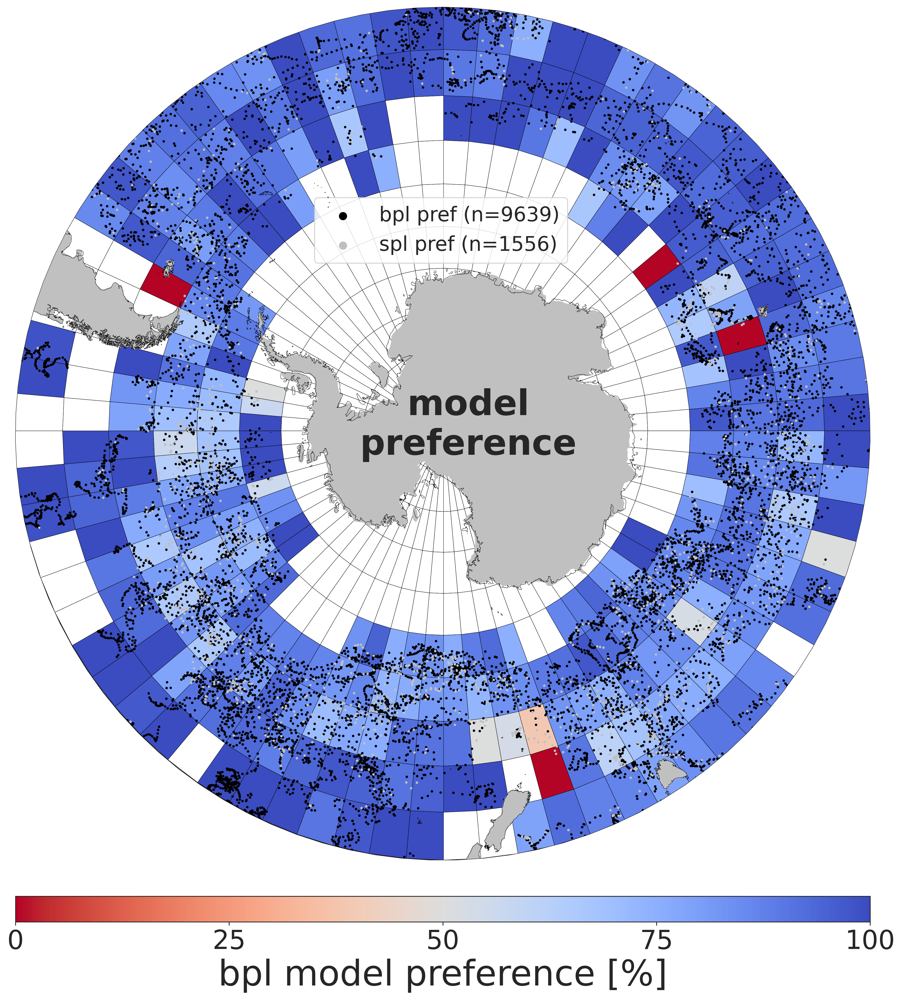

In [7]:
# Figure 2a

# create masks to filter for model preference by POC algorithm
df_koest = df_results[df_results['POC Type'] == 'poc_koest_bc']

df_k_spl = df_koest[df_koest['Model Preference']=='SPL']
df_k_bpl = df_koest[df_koest['Model Preference']=='BPL']


# Combine datasets
df_spl = df_k_spl.copy()
df_spl['class'] = 'spl'
df_bpl = df_k_bpl.copy()
df_bpl['class'] = 'bpl'
df_all = pd.concat([df_spl, df_bpl])

deg = 5

# Bin to 2x2 grid
df_all['lon_bin'] = np.floor(df_all['lon'] / deg) * deg
df_all['lat_bin'] = np.floor(df_all['lat'] / deg) * deg

# Count SPL/BPL in each cell
counts = df_all.groupby(['lat_bin', 'lon_bin', 'class']).size().unstack(fill_value=0)
counts['total'] = counts.sum(axis=1)
counts['bpl_fraction'] = counts['bpl'] / counts['total']

# Setup custom diverging colormap: grey (0) to white (0.5) to purple (1)
diverging_cmap = cm.coolwarm_r

# Setup map
extent = [-180, 180, -90, -40]
theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])

fig = plt.figure(figsize=(13, 14), dpi=300, num=1, clear=True)
ax = plt.axes(projection=ccrs.SouthPolarStereo())
ax.set_extent(extent, ccrs.PlateCarree())
ax.set_facecolor([0.95, 0.95, 0.95])
ax.coastlines(resolution="10m", zorder=16, linewidth=0.3)
ax.add_feature(cfeature.LAND, color='silver', lw=0.3, zorder=11)
ax.set_boundary(map_circle, transform=ax.transAxes)

# Fill grid boxes
all_lats = np.arange(-90, -40, deg)
all_lons = np.arange(-180, 180, deg)
for lat in all_lats:
    for lon in all_lons:
        key = (lat, lon)
        if key in counts.index:
            frac = counts.loc[key, 'bpl_fraction']
            color = diverging_cmap(frac)
        else:
            color = 'white'

        rect = Rectangle((lon, lat), deg, deg,
                         transform=ccrs.PlateCarree(),
                         facecolor=color,
                         edgecolor='k',
                         linewidth=0.3,
                         zorder=5)
        ax.add_patch(rect)

# Overlay original points
ax.scatter(df_k_bpl.lon, df_k_bpl.lat, c='black', transform=ccrs.PlateCarree(), s=2, alpha=1, label='bpl pref (n=9639)', zorder=100)
ax.scatter(df_k_spl.lon, df_k_spl.lat, c='silver', transform=ccrs.PlateCarree(), s=2, alpha=1, label='spl pref (n=1556)', zorder=100)


# Gridlines
gl = ax.gridlines(draw_labels=False, linewidth=0.5, linestyle='--',
                  color='black', alpha=0.8, zorder=100)
gl.right_labels = False
gl.bottom_labels = False

# Colorbar
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="3%", pad=0.5, axes_class=plt.Axes)
cb = plt.colorbar(
    plt.cm.ScalarMappable(cmap=diverging_cmap),
    cax=cax,
    orientation='horizontal',
    ticks=[0, 0.25, 0.5, 0.75, 1]
)
cb.set_label('bpl model preference [%]', fontsize=35)
cb.ax.set_xticklabels(['0', '25', '50', '75', '100'], fontsize=26)
ax.legend(loc=(0.35,0.7), fontsize=20,markerscale=5)
ax.text(0.53, 0.51, 'model' + '\n' + 'preference', transform=ax.transAxes, fontsize=35, fontweight='bold', va='center', ha='center', zorder=100)

# Final layout
plt.tight_layout()
plt.show()


### Figure 2b: b-values vs. NPP

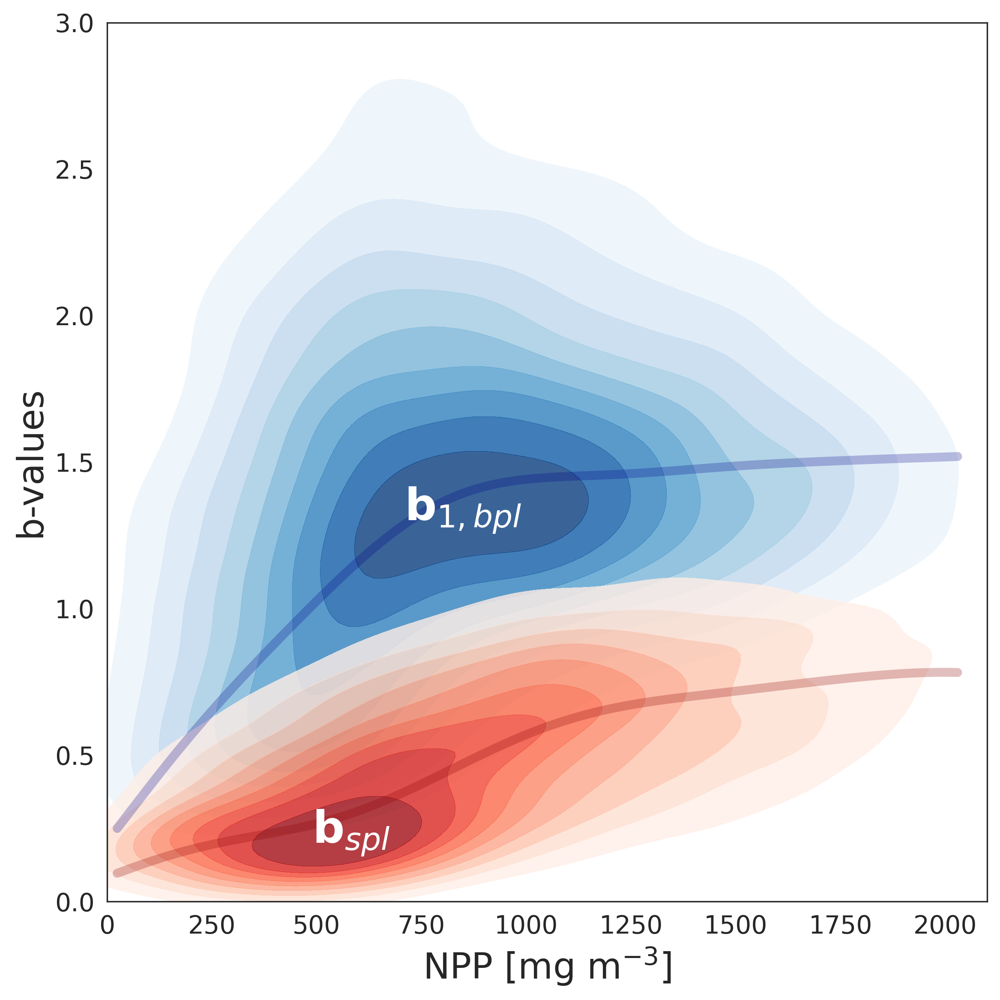

In [8]:
#Fig 2b

from scipy.signal import butter, filtfilt
df_k_spl = df_koest[df_koest['Model Preference']=='SPL']
df_k_bpl = df_koest[df_koest['Model Preference']=='BPL']

# --- Create binned medians ---
df = df_koest
bins = np.arange(25, 2100, 20)

mean_b1 = df['Par_b1_k'].groupby(pd.cut(df['NPP'], bins=bins),observed=False).median()
mean_b = df['Par_b_k'].groupby(pd.cut(df['NPP'], bins=bins),observed=False).median()
mean_npp = df['NPP'].groupby(pd.cut(df['NPP'], bins=bins),observed=False).mean()

# --- Butterworth Filter Parameters ---
order = 3  # filter order
cutoff = 0.05  # normalized cutoff frequency (0 < Wn < 1)

# Define low-pass Butterworth filter
b, a = butter(order, cutoff, btype='low', analog=False)

# Apply zero-phase filtering (NaNs will break filtfilt — drop them first)
mask = (~mean_b1.isna()) & (~mean_npp.isna())
smoothed_b1 = pd.Series(filtfilt(b, a, mean_b1[mask]), index=mean_b1[mask].index)
smoothed_b = pd.Series(filtfilt(b, a, mean_b[mask]), index=mean_b[mask].index)
smoothed_npp = pd.Series(filtfilt(b, a, mean_npp[mask]), index=mean_npp[mask].index)



# Initialize plot
plt.figure(figsize=(8, 8), dpi=300)

# KDE for b1,bpl
sns.kdeplot(
    x=df_k_bpl['NPP'], y=df_k_bpl['Par_b1_k'],
    fill=True, cmap="Blues", alpha=0.8, levels=10, thresh=0.15, cbar=False)


# KDE for b,spl
sns.kdeplot(
    x=df_k_bpl['NPP'], y=df_k_bpl['Par_b_k'],
    fill=True, cmap="Reds", alpha=0.8, levels=10, thresh=0.15, cbar=False)


plt.plot(smoothed_npp, smoothed_b1, linestyle='-', linewidth=5, color='darkblue', alpha=0.25)
plt.plot(smoothed_npp, smoothed_b, linestyle='-', linewidth=5, color='darkred', alpha=0.25)

plt.xlim(0,2100)
plt.ylim(0,3)
#plt.plot([0,3],[0,3],'k-')
# Add legend and labels
plt.xlabel("NPP [mg m$^{-3}$]", fontsize=20)
plt.ylabel("b-values", fontsize=20)
#plt.legend()
plt.text(710, 1.3, 'b$_{1, bpl}$', color = 'white', fontsize=25,fontweight='bold')
plt.text(490, 0.2, 'b$_{spl}$', color = 'white', fontsize=25,fontweight='bold')
plt.grid(False)
plt.tight_layout()

plt.show()


## Figure 3: Seasonal cycles

In [9]:
# very slow
# compute seasonal cycle of TE at 200 m
TE_bpl_200  = np.array([])
TE_spl_200  = np.array([])


for nprof in ds_floats.n_prof.data:
   # print(nprof)
    b1 = ds_floats.Par_b1_k.sel(n_prof = nprof)
    b2 = ds_floats.Par_b2_k.sel(n_prof = nprof)
    b = ds_floats.Par_b_k.sel(n_prof = nprof)
    z_prod = ds_floats.z_prod.sel(n_prof = nprof)
    z_trans = ds_floats.Par_z_k.sel(n_prof = nprof)

    levs = 200
    te1 = np.where(levs > z_prod, np.where(levs < z_trans, (levs / z_prod) ** (-b1), (z_trans / z_prod) ** (-b1) * (levs / z_trans) ** (-b2)), 1)  
    te2 =  np.where(levs > z_prod, (levs / z_prod) ** (-b), 1)
      
    TE_bpl_200 = np.append(TE_bpl_200, te1)
    TE_spl_200 = np.append(TE_spl_200, te2)

print(' -- DONE')

 -- DONE


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should

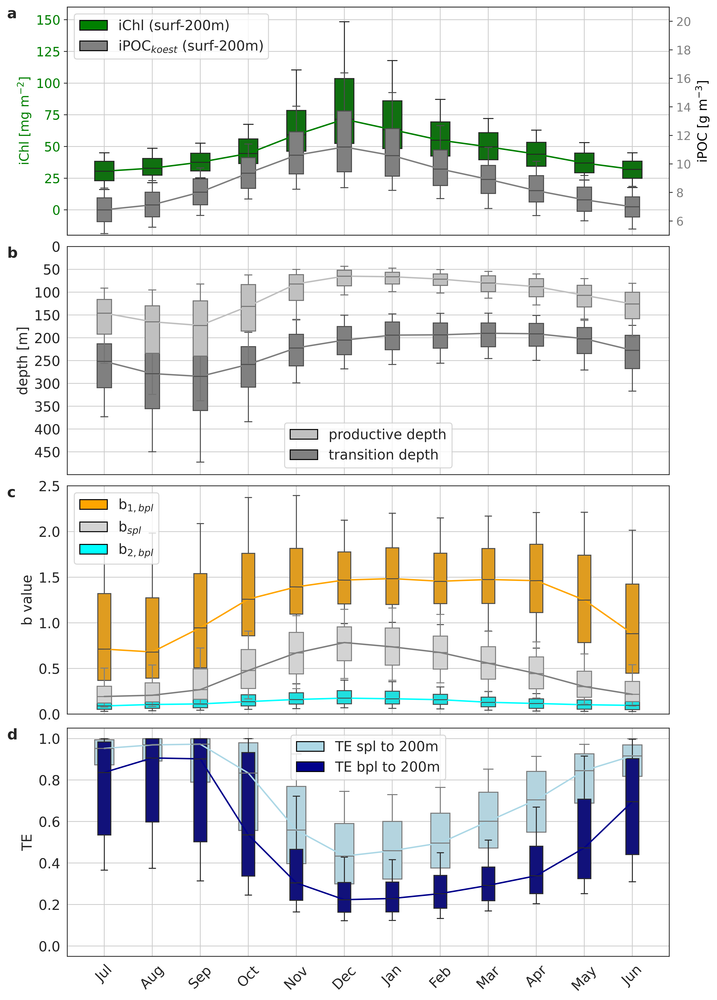

In [10]:
# Fig 3:

# Results Seasonal Cycles for 1. Chl, POC, 2. depths, 3. b values

ds = ds_floats.sel(pressure=np.arange(0, 200)).sum(dim='pressure')
ds['TE_bpl_250'] =  (('n_prof'), TE_bpl_200)
ds['TE_spl_250'] = (('n_prof'), TE_spl_200)


width =  0.3
flierprops = dict(marker='.', color='white', alpha=0.5, markersize=0)

# Define month order from July to June
month_order = [7, 8, 9, 10, 11, 12, 1, 2, 3, 4, 5, 6] 
months_to_plot = [6, 7, 8, 9, 10, 11, 0, 1, 2, 3, 4, 5]
month_names = ['Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
month_shift = ds.month.values+0.3
month_order_shift = [7.3, 8.3, 9.3, 10.3, 11.3, 12.3, 1.3, 2.3, 3.3, 4.3, 5.3, 6.3]

###################### Inititalize figure #########################

fig, axes = plt.subplots(4, 1, figsize=(10, 14), dpi=500, num=1, clear= True, sharex = True, constrained_layout=True)

###################### Subplot 1: CHL, POC ######################
ax1 = axes[0]
# Chlorophyll
ax1.set_ylabel('iChl [mg m$^{-2}$]', color='green',fontsize=13)
sns.boxplot(x=ds.month.values, y=ds.chla.values, ax=ax1, color='green', width=0.4, whis=(10, 90), flierprops=flierprops ,order=month_order, linewidth=1)
ax1.tick_params(axis='y', labelcolor='green',labelsize=13)
ax1.set_ylim(-20,160)

# POC Koest - Another twin axis
ax11 = ax1.twinx()
ax11.set_ylabel('iPOC [g m$^{-3}$] ', color='black', fontsize=13)
sns.boxplot(x=ds.month.values, y=ds.poc_koest_bc.values/1000, ax=ax11, color='grey', width=width, flierprops=flierprops,whis=(10, 90), order=month_order, linewidth=1)
sns.lineplot(x=months_to_plot, y=ds.poc_koest_bc.groupby('time.month').median()/1000, ax=ax11, color='grey')
sns.lineplot(x=months_to_plot, y=ds.chla.groupby('time.month').median(), ax=ax1, color='green')

ax11.tick_params(axis='y', labelcolor='grey', labelsize=12)
ax11.set_ylim(5,21)


legend_elements = [  Patch(facecolor='green', edgecolor='black', label='iChl (surf-200m)'),
                     Patch(facecolor='grey', edgecolor='black', label='iPOC$_{koest}$ (surf-200m)')]
                   #  Patch(facecolor='silver', edgecolor='black', label='iPOC$_{john}$')]

ax1.legend(handles=legend_elements, loc='upper left')

###################### Subplot 2: porductive depth, transition depth ######################
ax2 = axes[1]
sns.boxplot(x=ds.month.values, y=ds.Par_z_k.values, ax=ax2, color='grey', width=width,flierprops=flierprops, whis=(10, 90), order=month_order,linewidth=1)
sns.boxplot(x=ds.month.values, y=ds.z_prod.values, ax=ax2, color='silver', width=width, whis=(10, 90), flierprops=flierprops,order=month_order,linewidth=1)
sns.lineplot(x=months_to_plot, y=ds.Par_z_k.groupby('time.month').median(), ax=ax2, color='grey')
sns.lineplot(x=months_to_plot, y=ds.z_prod.groupby('time.month').median(), ax=ax2, color='silver')


ax2.set_ylim(500, 0)
ax2.set_yticks(np.arange(0,500,50))
ax2.set_ylabel('depth [m]')
# Create legend manually
legend_elements1 = [ Patch(facecolor='silver', edgecolor='black', label='productive depth'),
                     Patch(facecolor='grey', edgecolor='black', label= 'transition depth')]

ax2.legend(handles=legend_elements1, loc='lower center')

###################### Subplot 3: b values ######################
ax3 = axes[2]
sns.boxplot(x=ds.month.values, y=ds.Par_b1_k.values,gap=0.1, ax=ax3, color='orange', width=width, whis=(10, 90),flierprops=flierprops, order=month_order,linewidth=1)
sns.boxplot(x=ds.month.values, y=ds.Par_b2_k.values, ax=ax3, color='cyan', width=width, whis=(10, 90),flierprops=flierprops, order=month_order,linewidth=1)
sns.boxplot(x=ds.month.values, y=ds.Par_b_k.values, ax=ax3, color='lightgrey', width=width, whis=(10, 90),flierprops=flierprops,order=month_order,linewidth=1)
sns.lineplot(x=months_to_plot, y=ds.Par_b1_k.groupby('time.month').median(), ax=ax3, color='orange')
sns.lineplot(x=months_to_plot, y=ds.Par_b2_k.groupby('time.month').median(), ax=ax3, color='cyan')
sns.lineplot(x=months_to_plot, y=ds.Par_b_k.groupby('time.month').median(), ax=ax3, color='grey')
ax3.set_ylim(0, 2.5)
ax3.set_ylabel('b value')

legend_elements2 = [Patch(facecolor='orange', edgecolor='black', label='b$_{1, bpl}$'),
                    Patch(facecolor='lightgrey', edgecolor='black', label='b$_{spl}$'),
                    Patch(facecolor='cyan', edgecolor='black', label='b$_{2, bpl}$')]

ax3.legend(handles=legend_elements2, loc='upper left')


###################### Subplot 4: TE efficiencies ######################
ax4 = axes[3]
sns.boxplot(x=ds.month.values, y=ds.TE_spl_250.values, ax=ax4, color='lightblue', width=0.4, whis=(10, 90),flierprops=flierprops, order=month_order,linewidth=1)
sns.boxplot(x=ds.month.values, y=ds.TE_bpl_250.values,gap=0.1, ax=ax4, color='darkblue', width=width, whis=(10, 90),flierprops=flierprops, order=month_order,linewidth=1)

sns.lineplot(x=months_to_plot, y=ds.TE_spl_250.groupby('time.month').median(), ax=ax4, color='lightblue')
sns.lineplot(x=months_to_plot, y=ds.TE_bpl_250.groupby('time.month').median(), ax=ax4, color='darkblue')

ax4.set_ylabel('TE')

legend_elements3 = [Patch(facecolor='lightblue', edgecolor='black', label='TE spl to 200m'),
                     Patch(facecolor='darkblue', edgecolor='black', label='TE bpl to 200m')]


ax4.legend(handles=legend_elements3, loc='upper center')
ax4.set_xticklabels(month_names, rotation=45)


ax1.grid(True)
ax11.grid(False)
ax2.grid(True)
ax3.grid(True)
ax4.grid(True)


ax1.text(-0.1, 1, 'a', transform=ax1.transAxes, fontsize=15, fontweight='bold', va='top', ha='left')
ax2.text(-0.1, 1, 'b', transform=ax2.transAxes, fontsize=15, fontweight='bold', va='top', ha='left')
ax3.text(-0.1, 1, 'c', transform=ax3.transAxes, fontsize=15, fontweight='bold', va='top', ha='left')
ax4.text(-0.1, 1, 'd', transform=ax4.transAxes, fontsize=15, fontweight='bold', va='top', ha='left')


plt.show()


## Figure 4: Correlation b-vlaues with Temperature and NPP

### Subsample dataset

In [13]:

print('Create Zone dataset')
npp_mask =  ds_floats.npp.sel(pressure=np.arange(0,200)).sum(dim='pressure') > 0
ds_floats_npp = ds_floats.isel(n_prof=npp_mask)

ds_param = ds_floats_npp[['Par_b1_k','Par_b2_k','Par_b_k','Par_cd_k', 'Par_cs_k' ,'npp', 'TEMP_ADJUSTED', 'DOXY_ADJUSTED',
                          'zone','sonif','z_prod', 'Par_z_k']]


print('assign temp at z_prod and z_trans')
# create temp_z_prod and temp_z_trans variables
ds_param['temp_z_prod'] = ds_param.TEMP_ADJUSTED.interp(pressure=ds_param.z_prod)
ds_param['temp_z_trans'] = ds_param.TEMP_ADJUSTED.interp(pressure=ds_param.Par_z_k)

print(' compute median temp for b1, b2 range')
# take median temperature for whole range
# Ensure pressure is 2D (pressure, n_prof)
pressure_2d = ds_param['pressure'].broadcast_like(ds_param['TEMP_ADJUSTED'])

# Compute the upper bound (z_prod + 100)
z_upper = ds_param['Par_z_k'] 

# Broadcast bounds to 2D to match TEMP_ADJUSTED shape
z_prod_2d = ds_param['z_prod'].broadcast_like(pressure_2d)
z_upper_2d = z_upper.broadcast_like(pressure_2d)

# Create a mask: True where pressure is within the range for that profile
valid_mask = (pressure_2d >= z_prod_2d) & (pressure_2d <= z_upper_2d)

# Mask the temperature data
temp_masked = ds_param['TEMP_ADJUSTED'].where(valid_mask)

# Compute median along pressure dimension (Dask-aware)
temp_median = temp_masked.reduce(np.nanmean, dim='pressure')

# Assign back
ds_param['temp_mean_prod_to_trans'] = temp_median


#####################################################
# same for b2

# Compute the upper bound (z_trans + 200)
z_upper = ds_param['Par_z_k'] + 200

# Broadcast bounds to 2D to match TEMP_ADJUSTED shape
z_prod_2d = ds_param['Par_z_k'].broadcast_like(pressure_2d)
z_upper_2d = z_upper.broadcast_like(pressure_2d)

# Create a mask: True where pressure is within the range for that profile
valid_mask = (pressure_2d >= z_prod_2d) & (pressure_2d <= z_upper_2d)

# Mask the temperature data
temp_masked = ds_param['TEMP_ADJUSTED'].where(valid_mask)

# Compute median along pressure dimension (Dask-aware)
temp_median = temp_masked.reduce(np.nanmean, dim='pressure')

# Assign back
ds_param['temp_mean_trans_to_p200'] = temp_median


######################################################
#print(' doxy at z_prod and z_trans')
# create oxy_z_prod and oxy_z_trans variables
#ds_param['doxy_z_prod'] = ds_param.DOXY_ADJUSTED.interp(pressure=ds_param.z_prod)
#ds_param['doxy_z_trans'] = ds_param.DOXY_ADJUSTED.interp(pressure=(ds_param.z_prod+ds_param.Par_z_k))

print('Antarctic Zone ---')
mask = ds_param['zone'].isin(['az'])
ds = ds_param.isel(n_prof=mask)
mask = ds['sonif'].isin(['SOATLANTIC'])
da = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
da['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

mask = ds['sonif'].isin(['SOINDIAN'])
di = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
di['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

mask = ds['sonif'].isin(['SOPACIFIC'])
dp = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
dp['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

d_az = xr.concat([da,di,dp], dim='month')
print('            --- Done')
#########################################################
print('Polar Front Zone ---')
mask = ds_param['zone'].isin(['pfz'])
ds = ds_param.isel(n_prof=mask)
mask = ds['sonif'].isin(['SOATLANTIC'])
da = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
da['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

mask = ds['sonif'].isin(['SOINDIAN'])
di = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
di['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

mask = ds['sonif'].isin(['SOPACIFIC'])
dp = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
dp['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

d_pfz = xr.concat([da,di,dp], dim='month')
print('               --- Done')
###########################################################
print('Sub Antarctic Zone ---')
mask = ds_param['zone'].isin(['saz'])
ds = ds_param.isel(n_prof=mask)
mask = ds['sonif'].isin(['SOATLANTIC'])
da = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
da['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

mask = ds['sonif'].isin(['SOINDIAN'])
di = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
di['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

mask = ds['sonif'].isin(['SOPACIFIC'])
dp = ds.isel(n_prof=mask).groupby('time.month').mean(dim='n_prof')
dp['Par_b1_var'] = ds.isel(n_prof=mask).Par_b1_k.groupby('time.month').std(dim='n_prof')

d_saz = xr.concat([da,di,dp], dim='month')
print('               --- Done')


print('Done')

Create Zone dataset
assign temp at z_prod and z_trans
 compute median temp for b1, b2 range
Antarctic Zone ---
            --- Done
Polar Front Zone ---
               --- Done
Sub Antarctic Zone ---
               --- Done
Done


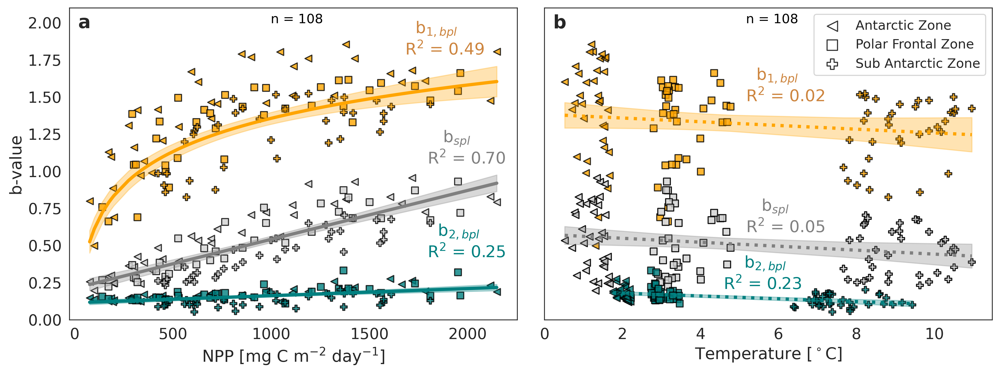

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.stats import t, pearsonr
from sklearn.metrics import r2_score

ds_zones = [d_az,d_pfz,d_saz]
ds_comb = xr.concat(ds_zones, dim = 'month')


zone_label = ['Antarctic Zone', 'Polar Frontal Zone', 'Sub Antarctic Zone']
markers= ['<','s', 'P']



def linreg(x, a, b):
    return a * x + b

def logreg(x, a, b):
    return a * np.log(x) + b

def fit_and_plot(ax, x, y, color, label, style='solid', alpha=0.3, is_log=False, sigma=None):
    model = logreg if is_log else linreg
    popt, pcov = curve_fit(model, x, y, sigma=sigma if sigma is not None else None)
    r2 = np.round(r2_score(y, model(x, *popt)), 2)
    
    # Residuals and CI
    x_sorted = np.sort(x)
    y_fit = model(x_sorted, *popt)
    residuals = y - model(x, *popt)
    std_err = np.sqrt(np.sum(residuals**2) / (len(x) - 2))
    t_val = t.ppf(0.975, len(x) - 2)
    ci = t_val * std_err * np.sqrt(1/len(x) + (x_sorted - np.mean(x))**2 / np.sum((x - np.mean(x))**2))

    # Plot
    ax.plot(x_sorted, y_fit, color=color, linestyle=style, linewidth=3, alpha=1)
    ax.fill_between(x_sorted, y_fit - ci, y_fit + ci, color=color, alpha=alpha)

    # Pearson r
    r, p = pearsonr(x, y)
    return r, r2, p, len(y)

fit_results = []  
def fit_and_plot(ax, x, y, color, label, param_type, style='solid', alpha=0.3, is_log=False, sigma=False):
    model = logreg if is_log else linreg
    popt, pcov = curve_fit(model, x, y, sigma=0.6*y if sigma else None)
    a, b = popt
    r2 = np.round(r2_score(y, model(x, *popt)), 2)

    # 1-sigma errors
    perr = np.sqrt(np.diag(pcov))
    a_err, b_err = perr

    # Residuals and CI
    x_sorted = np.sort(x)
    y_fit = model(x_sorted, *popt)
    residuals = y - model(x, *popt)
    std_err = np.sqrt(np.sum(residuals**2) / (len(x) - 2))
    t_val = t.ppf(0.975, len(x) - 2)
    ci = t_val * std_err * np.sqrt(1/len(x) + (x_sorted - np.mean(x))**2 / np.sum((x - np.mean(x))**2))

    # Plot
    ax.plot(x_sorted, y_fit, color=color, linestyle=style, linewidth=3, alpha=1)
    ax.fill_between(x_sorted, y_fit - ci, y_fit + ci, color=color, alpha=alpha)

    # Pearson r
    r, p = pearsonr(x, y)
    n = len(y)

    # Store output in DataFrame
    df = pd.DataFrame([{
        'param': param_type,
        'label': label,
        'model': 'log' if is_log else 'lin',
        'slope': a,
        'slope_1sigma': a_err,
        'intercept': b,
        'intercept_1sigma': b_err,
        'r': r,
        'r2': r**2,
        'r_squared': r2,
        'p_value': p,
        'n': n
    }])

    return r, r2, p, n, df

    
# Create figure
fig, axs = plt.subplots(1, 2, figsize=(13, 5), dpi=300, sharex=False, sharey=True)

# Plot data per zone with different symbols
for j, zone in enumerate(['az', 'pfz', 'saz']):
    ds = ds_zones[j]
    Par_b1, Par_b2, Par_b = ds.Par_b1_k, ds.Par_b2_k, ds.Par_b_k
    param_npp = ds.npp.sel(pressure=np.arange(0,200)).sum(dim='pressure').data
    param1_temp = ds['temp_mean_prod_to_trans'].data
    param2_temp = ds['temp_mean_trans_to_p200'].data

    axs[0].scatter(param_npp, Par_b1, c='orange', edgecolors='black', s=40, alpha=0.8, marker=markers[j])
    axs[0].scatter(param_npp, Par_b, c='lightgrey', edgecolors='black', s=40, alpha=0.8, marker=markers[j], label=zone_label[j])
    axs[0].scatter(param_npp, Par_b2, c='teal', edgecolors='black', s=40, alpha=0.8, marker=markers[j])

    axs[1].scatter(param1_temp, Par_b1, c='orange', edgecolors='black', s=40, alpha=0.8, marker=markers[j])
    axs[1].scatter(param1_temp, Par_b, c='white', edgecolors='black', s=40, alpha=0.8, marker=markers[j], label=zone_label[j])
    axs[1].scatter(param1_temp, Par_b, c='lightgrey', edgecolors='black', s=40, alpha=0.8, marker=markers[j])
    axs[1].scatter(param2_temp, Par_b2, c='teal', edgecolors='black', s=40, alpha=0.8, marker=markers[j])

# Combined data for regression
ds = ds_comb
Par_b1, Par_b2, Par_b = ds.Par_b1_k.data, ds.Par_b2_k.data, ds.Par_b_k.data
param_npp = ds.npp.sel(pressure=np.arange(0,200)).sum(dim='pressure').data
param1_temp = ds['temp_mean_prod_to_trans'].data
param2_temp = ds['temp_mean_trans_to_p200'].data
sigma = False #0.6 * Par_b1

# === NPP axis regressions ===
ax = axs[0]
#r_b1, r2_b1, p_val_b1, n_b1 ,df = fit_and_plot(ax, param_npp, Par_b1, color='orange',param_type='NPP', label='b$_{1,bpl}$', is_log=False, sigma=False)
#fit_results.append(df)
r_b1, r2_b1_log, p_val_b1, n_b1 ,df = fit_and_plot(ax, param_npp, Par_b1, color='orange',param_type='NPP', label='b$_{1,bpl}$', is_log=True, sigma=True)
fit_results.append(df)
r_b2, r2_b2, p_val_b, _ ,df= fit_and_plot(ax, param_npp, Par_b2, color='teal',param_type='NPP', label='b$_{2,bpl}$', sigma = False)
fit_results.append(df)
r_b, r2_b, p_val_b, n_b, df = fit_and_plot(ax, param_npp, Par_b, color='grey',param_type='NPP', label='b$_{spl}$', sigma= False)
fit_results.append(df)

ax.text(0.8, 0.5, '   b$_{spl}$' + '\n'+ f"R$^2$ = {(r_b)**2:.2f}", color='grey', transform=ax.transAxes, fontsize=15)
ax.text(0.8, 0.2, '  b$_{2,bpl}$' + '\n'+ f"R$^2$ = {r2_b2:.2f}", color='teal', transform=ax.transAxes, fontsize=15)
ax.text(0.75, 0.85, '  b$_{1,bpl}$' + '\n'+ f"R$^2$ = {r2_b1_log:.2f}", color='peru', transform=ax.transAxes, fontsize=15)
ax.text(0.45, 0.95,  f"n = {n_b1}", color='black', transform=ax.transAxes, fontsize=12)

ax.set_xlabel('NPP [mg C m$^{-2}$ day$^{-1}$]', fontsize=15)
ax.set_ylabel('b-value', fontsize=15)
ax.set_ylim(0, 2.1)
#ax.text(-0.2, 0.3, '$b_{2,bpl}$', color='teal', rotation=90, transform=ax.transAxes, fontsize=17, fontweight='bold', va='top')
#ax.text(-0.2, 0.5, '$b_{spl}$', color='grey', rotation=90, transform=ax.transAxes, fontsize=17, fontweight='bold', va='top')
#ax.text(-0.2, 0.8, '$b_{1,bpl}$', color='peru', rotation=90, transform=ax.transAxes, fontsize=17, fontweight='bold', va='top')

# === Temperature axis regressions ===
ax = axs[1]
r_b1_temp, r2_b1_temp, p_val_b1_temp, n_b1_temp, df = fit_and_plot(ax, param1_temp, Par_b1,param_type='Temp', color='orange', label='b$_{1,bpl}$', style='dotted')
fit_results.append(df)
r_b2_temp, r2_b2_temp, p_val_b2_temp, _, df = fit_and_plot(ax, param2_temp, Par_b2, color='teal',param_type='Temp', label='b$_{2,bpl}$', style='dotted')
fit_results.append(df)
r_b_temp, r2_b_temp, p_val_b_temp, n_b_temp,df = fit_and_plot(ax, param1_temp, Par_b, color='grey',param_type='Temp', label='b$_{spl}$', style='dotted', sigma=sigma)
fit_results.append(df)

# Marsay temperature relationship
#ax.plot(np.arange(1,11,1), 0.062 * np.arange(1,11,1) + 0.303, linestyle= '--', color= 'black', linewidth = 0.5 )


ax.set_xlabel('Temperature [$^\circ$C]', fontsize=15)
ax.text(0.45, 0.7, '  b$_{1,bpl}$' + '\n'+ f"R$^2$ = {r2_b1_temp:.2f}", color='peru', transform=ax.transAxes, fontsize=15)
ax.text(0.45, 0.28,  '   b$_{spl}$' + '\n'+f"R$^2$ = {(r_b_temp)**2:.2f}", color='grey', transform=ax.transAxes, fontsize=15)
ax.text(0.4, 0.098,  '    b$_{2,bpl}$' + '\n'+f"R$^2$ = {r2_b2_temp:.2f}", color='teal', transform=ax.transAxes, fontsize=15)
##ax.text(0.45, 0.7, f"R$^2$ = {r2_b1_temp:.2f}", color='peru', transform=ax.transAxes, fontsize=15)
#ax.text(0.45, 0.28, f"R$^2$ = {(r_b_temp)**2:.2f}", color='grey', transform=ax.transAxes, fontsize=15)
#ax.text(0.4, 0.098, f"R$^2$ = {r2_b2_temp:.2f}", color='teal', transform=ax.transAxes, fontsize=15)
ax.text(0.45, 0.95,  f"n = {n_b1_temp}", color='black', transform=ax.transAxes, fontsize=12)

# Labels and layout
axs[0].text(0.02, 0.98, 'a', transform=axs[0].transAxes, fontsize=17, fontweight='bold', va='top')
axs[1].text(0.02, 0.98, 'b', transform=axs[1].transAxes, fontsize=17, fontweight='bold', va='top')
axs[1].legend(loc='upper right', fontsize=12, markerscale=1.5)


plt.tight_layout()
plt.show()


fit_summary_df = pd.concat(fit_results, ignore_index=True)


In [16]:
# print table with results
fit_summary_df

,param,label,model,slope,slope_1sigma,intercept,intercept_1sigma,r,r2,r_squared,p_value,n
0,NPP,"b$_{1,bpl}$",log,0.323867,0.022776,-0.881243,0.144029,0.670488,0.449555,0.49,2.065069e-15,108
1,NPP,"b$_{2,bpl}$",lin,0.000048,0.000008,0.113596,0.008356,0.504228,0.254245,0.25,2.643145e-08,108
2,NPP,b$_{spl}$,lin,0.000330,0.000021,0.211336,0.022028,0.836103,0.699067,0.70,2.104533e-29,108
3,Temp,"b$_{1,bpl}$",lin,-0.012530,0.008126,1.382949,0.046596,-0.148112,0.021937,0.02,1.260739e-01,108
4,Temp,"b$_{2,bpl}$",lin,-0.009433,0.001679,0.197087,0.008196,-0.479087,0.229525,0.23,1.561215e-07,108
5,Temp,b$_{spl}$,lin,-0.013334,0.005680,0.574547,0.032570,-0.222302,0.049418,0.05,2.075781e-02,108


## Figure 5

### monthly surface carbon

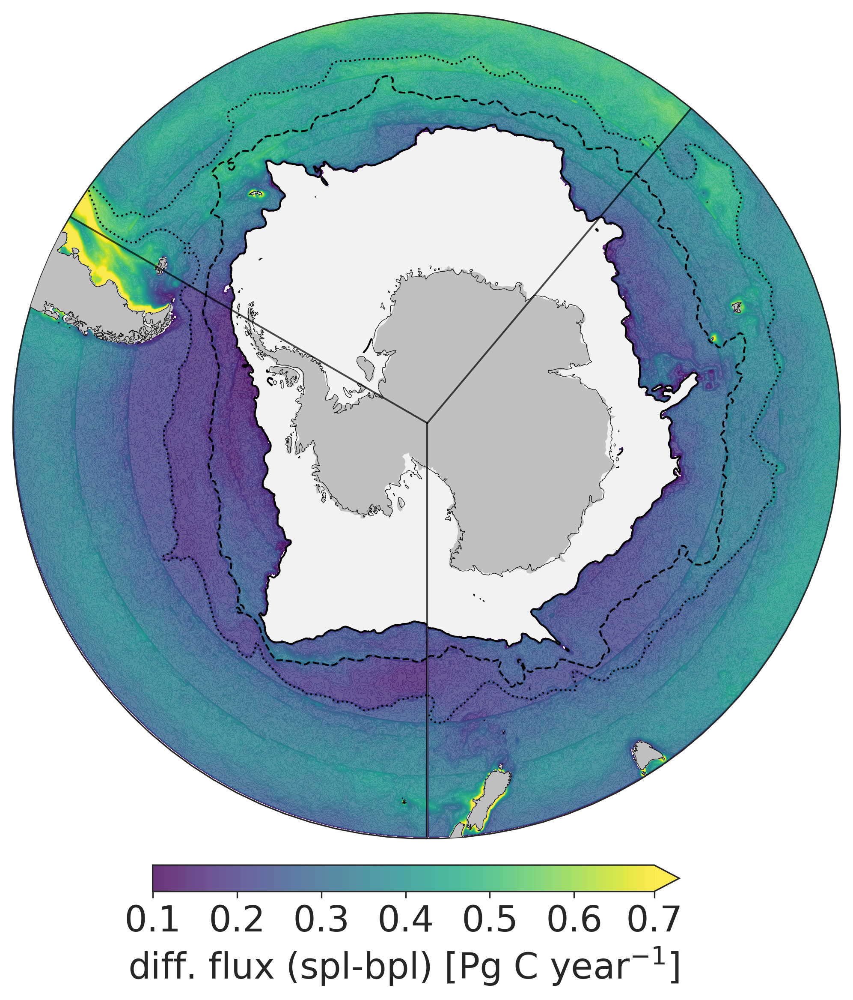

In [18]:
# ---- Set up figure and projection

fig, ax1 = plt.subplots(1, 1, figsize=(8, 8), subplot_kw={'projection': ccrs.SouthPolarStereo()}, dpi=300)

# Prepare circular boundary for all subplots
theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])


ssh= ds_ssh.sel(month=1)
levs = np.arange(0,1,0.1)
levs = [0,0.45, 0.62,0.87, 1]  # float dyn height
levs = [-1.1, -0.65, -0.1, 1]  # ssh

levs = [-1.1, -0.69 , -0.65, -0.14 ,-0.1, 1]  # ssh
#levs = [0,0.45, 0.72,0.97, 2]   # (ssh + mdt) + 50dbar offset

zone_colors = ['cyan',  'orange', 'darkblue']
zone_map = ListedColormap(zone_colors)


# Plot variables for each panel
months = [1, 4, 7, 10]  # for example: Jan, Apr, Jul, Oct
extent = [-180, 180, -90, -40]

# map for SSH contours to match dyn height from floats:
lev_c = np.arange(0,50,1)

#ax3 = plt.axes(projection=ccrs.SouthPolarStereo())
ax1.set_extent(extent, ccrs.PlateCarree())
ax1.set_facecolor([0.95, 0.95, 0.95])
ax1.coastlines(resolution = "50m",zorder = 16, linewidth = 0.3)
ax1.add_feature(cfeature.LAND, color='silver', lw=0.3, zorder=11) #cfeature.COLORS['land_alt1']
ax1.set_boundary(map_circle, transform=ax1.transAxes)


# absolute difference
carbon = ((ds_cbpm.TE_spl.sel(pressure=200) - ds_cbpm.TE_bpl.sel(pressure=200))*ds_cbpm.tot_carbon).sum(dim='month', skipna=True) *1e-12 *20
# relative difference
#carbon = ((ds_cbpm.TE_spl.sel(pressure=200) - ds_cbpm.TE_bpl.sel(pressure=200)/ds_cbpm.TE_spl.sel(pressure=200))*ds_cbpm.tot_carbon).sum(dim='month', skipna=True) *1e-12 *20

mm = ax1.contourf(carbon.lon.data, carbon.lat.data, carbon.data,np.arange(0.1,0.7,0.005),transform=ccrs.PlateCarree(), extend='max', cmap = 'viridis',alpha = 0.8)

cbar = plt.colorbar(mm,fraction = 0.03, pad = 0.03, orientation='horizontal')
cbar.set_label(label ='diff. flux (spl-bpl) [Pg C year$^{-1}$]',fontsize=20)
cbar.set_ticks(ticks=[0.1,0.2,0.3,0.4,0.5,0.6,0.7], labels=[0.1,0.2,0.3,0.4,0.5,0.6,0.7], fontsize = 20)

ax1.plot([-180,-180],[-90,-40], 'k-', linewidth=1, transform=ccrs.PlateCarree(),alpha=0.7, zorder=20)
ax1.plot([-60,-60],[-90,-40], 'k-', linewidth = 1, transform=ccrs.PlateCarree(), alpha=0.7, zorder=20)
ax1.plot([40,40],[-90,-40], 'k-', linewidth=1, transform=ccrs.PlateCarree(), alpha=0.7, zorder=20)

levs = [-1.1,  -0.65, -0.1, 1]  # ssh
ax1.contour(ssh.longitude.data, ssh.latitude.data, ssh.adt.data,levs, colors = ['k'],linestyles=['-','--','dotted'],linewidths=[1], transform=ccrs.PlateCarree(),zorder=10, alpha=1)

plt.tight_layout()
plt.show()

### carbon export, depth-resolved bar plots across regions

In [19]:
###########################################################################
###########################################################################

sinking = 20  # m/day
days = 30     # avg days per month
# keep lat lon
export_bpl_so = (ds_cbpm.TE_bpl * ds_cbpm.tot_carbon) * sinking * 30 # days in a month
export_spl_so = (ds_cbpm.TE_spl * ds_cbpm.tot_carbon) * sinking * 30 # days in a month

# apply regional masks to compute regional Export

region_export_data = {}
depths = press
print(press)
reg_bpl = np.ones((22,0))
reg_spl = np.ones((22,0))
reg_anom = np.ones((22,0))


for region_name, mask in zone_basin_masks.items():
    region_mask = mask
    region_export_data[region_name] = {}
    export_bpl = export_bpl_so.where(region_mask).sum(dim=('lat', 'lon', 'month')).compute().data
    export_spl = export_spl_so.where(region_mask).sum(dim=('lat', 'lon', 'month')).compute().data

    anomaly = export_spl - export_bpl
    
    reg_bpl = np.c_[reg_bpl, export_bpl]
    reg_spl = np.c_[reg_spl, export_spl]
    reg_anom = np.c_[reg_anom, anomaly]
    

    region_export_data[region_name] = {
            'BPL': export_bpl,
            'SPL': export_spl,
            'Anomaly': anomaly,
            'depth' : depths}

ds_ex = xr.Dataset(
    data_vars=dict(
        export_bpl = (["depth", "region"], reg_bpl),
        export_spl = (["depth", "region"], reg_spl),
        export_anom = (["depth", "region"], reg_anom),
    ),
    coords=dict(
        depth=press,
        region=list(zone_basin_masks.keys())))
    
###########################################################################
###########################################################################
print('-- Done')

[  20   50   70  100  150  200  250  300  350  400  450  500  550  600
  650  700  750  800  850  900  950 1000]
-- Done


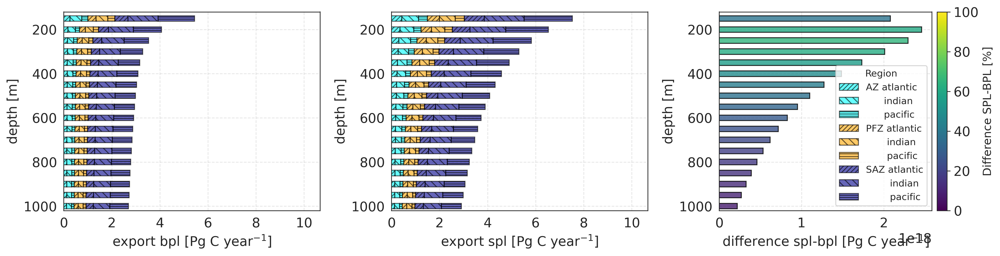

In [20]:
# Setup
region_colors = {
    'az_atl': 'cyan', 'az_ind': 'cyan', 'az_pac': 'cyan',
    'pfz_atl': 'orange', 'pfz_ind': 'orange', 'pfz_pac': 'orange',
    'saz_atl': 'darkblue', 'saz_ind': 'darkblue', 'saz_pac': 'darkblue'
}

region_hatches = {
    'az_atl': '/////', 'az_ind': '\\\\\\', 'az_pac': '-----',
    'pfz_atl': '/////', 'pfz_ind': '\\\\\\', 'pfz_pac': '----',
    'saz_atl': '/////', 'saz_ind': '\\\\\\', 'saz_pac': '-----'
}

region_names = list(region_export_data.keys())
depths = press
n_depths = len(depths)

# Extract data arrays: shape (regions, depths), in Pg C
bpl_data = np.array([region_export_data[r]['BPL'] for r in region_names])*1e-18
spl_data = np.array([region_export_data[r]['SPL'] for r in region_names])*1e-18
anomaly_data = np.array([region_export_data[r]['Anomaly'] for r in region_names])*1e-18

perc_data = np.array([region_export_data[r]['Anomaly']/region_export_data[r]['BPL'] for r in region_names])

# Plot
fig, axs = plt.subplots(1, 3, figsize=(15, 4), dpi=300, sharey=False)

# Helper: Stacked bar plot with hatching
def plot_stacked(ax, data, title):
    bottom = np.zeros(n_depths)
    for i, region in enumerate(region_names):
        vals = data[i]
        color = region_colors.get(region, 'gray')
        hatch = region_hatches.get(region, None)
        ax.barh(
            depths, vals,
            left=bottom,
            height=25,
            label=region,
            color=color,
            edgecolor='black',
            alpha=0.6,
            hatch=hatch
        )
        bottom += vals

    ax.set_ylim(1020,120)
   # ax.set_xlim(0,8)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# Plot each type
plot_stacked(axs[0], bpl_data, "Carbon export - bpl")
plot_stacked(axs[1], spl_data, "Carbon export - spl")
#axs[2].set_xlim(0,3)
plot_stacked(axs[2], anomaly_data, "difference (spl - bpl)")

#############################################################
################################################################

import matplotlib.cm as cm
import matplotlib.colors as colors

# Your computed perc array
perc = ((ds_ex.sum(dim='region').export_spl - ds_ex.sum(dim='region').export_bpl)
        / ds_ex.sum(dim='region').export_bpl * 100).data

# Normalize for colormap
norm = colors.Normalize(vmin=0, vmax=100)
cmap = cm.viridis  # or cm.plasma, cm.magma, etc.

# Compute colors
bar_colors = cmap(norm(perc))

bars = axs[2].barh(ds_ex.sum(dim='region').depth.data, ds_ex.sum(dim='region').export_anom, height=25, edgecolor='black', color=bar_colors,alpha=0.8)
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # required for matplotlib

cbar = plt.colorbar(sm, ax=axs[2], orientation='vertical', pad=0.02)
cbar.set_label('Difference SPL-BPL [%]', fontsize=12)

axs[0].set_xlabel("export bpl [Pg C year$^{-1}$]")
axs[0].set_ylabel("depth [m]")
axs[1].set_ylabel("depth [m]")
axs[2].set_ylabel("depth [m]")
axs[1].set_xlabel("export spl [Pg C year$^{-1}$]")
axs[2].set_xlabel("difference spl-bpl [Pg C year$^{-1}$]")

# Legend outside
handles, labels = axs[0].get_legend_handles_labels()
labels = ['AZ atlantic', '      indian', '      pacific', 'PFZ atlantic', '       indian', '       pacific', 'SAZ atlantic', '        indian', '        pacific']

axs[2].legend(handles, labels, loc='lower right', title="Region", fontsize=10, title_fontsize = 10)

plt.tight_layout()
plt.show()


/jobfs/155443836.gadi-pbs/ipykernel_1805580/2435694058.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', n_bins)
/jobfs/155443836.gadi-pbs/ipykernel_1805580/2435694058.py:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


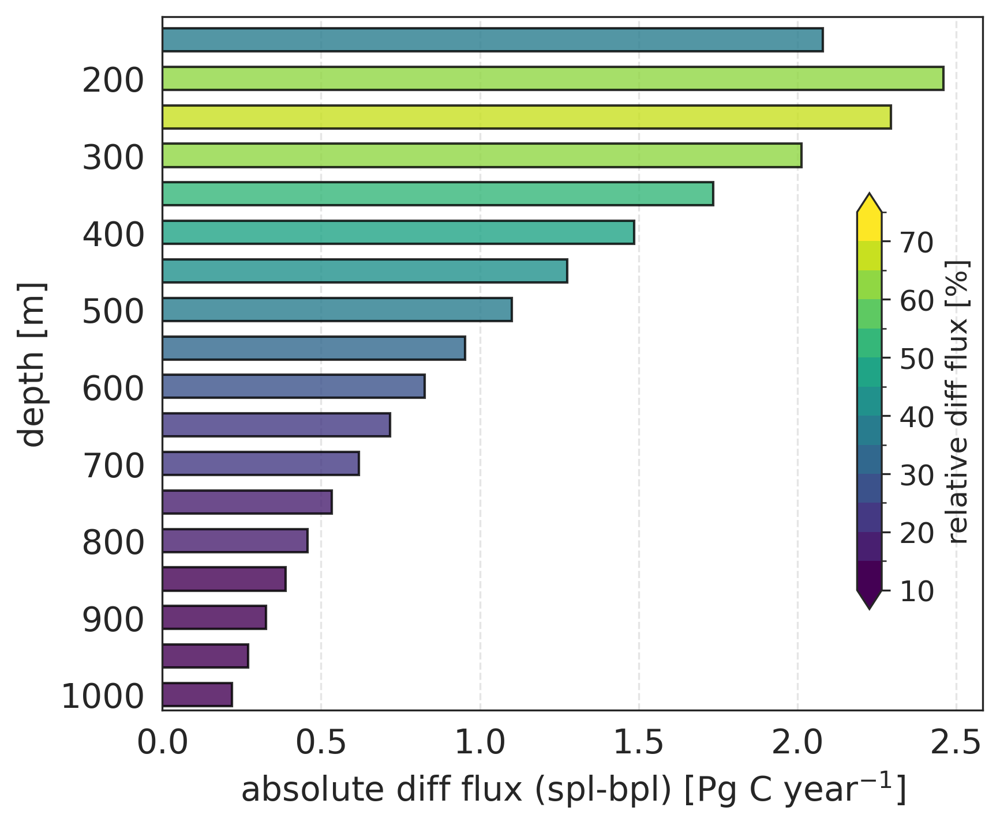

In [21]:
bar_height = 25
# Plot
import matplotlib.cm as cm
import matplotlib.colors as colors

def plot_stacked(ax, data, title):
    bottom = np.zeros(n_depths)
    for i, region in enumerate(region_names):
        vals = data[i]
        color = region_colors.get(region, 'gray')
        hatch = region_hatches.get(region, None)
        ax.barh(
            depths, vals,
          #  left=bottom,
            height=bar_height,
            label=region,
            color=color,
            edgecolor='black',
            alpha=0.8,
          #  hatch=hatch
        )
       # bottom += vals

    ax.set_ylim(1020,120)
    ax.grid(axis='x', linestyle='--', alpha=0.5)

# Create figure and axes
fig, axs = plt.subplots(1, 1, figsize=(6, 5), dpi=300, sharey=False)


# Your computed perc array
perc = ((ds_ex.sum(dim='region').export_spl - ds_ex.sum(dim='region').export_bpl)
        / ds_ex.sum(dim='region').export_bpl * 100).data

# Define discrete bins 
bounds = np.arange(10,80,5)
n_bins = len(bounds) - 1

# Create a ListedColormap with discrete colors from cividis
cmap = cm.get_cmap('viridis', n_bins)
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=n_bins)

# Compute colors
bar_colors = cmap(norm(perc))

bars = axs.barh(ds_ex.sum(dim='region').depth.data, ds_ex.sum(dim='region').export_anom*1e-18, height=30, edgecolor='black', color=bar_colors,alpha=0.8)
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # required for matplotlib

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Create inset axes inside axs for the colorbar
cax = inset_axes(
    axs,
    width="3%",          # width as % of parent axes
    height="60%",        # height as % of parent axes
    loc='lower right',   # anchor to bottom right inside
    borderpad=3       # space to the edge
)

# Create vertical colorbar inside plot
cbar = plt.colorbar(
    sm,
    cax=cax,
    orientation='vertical',
    extend='both'
)

cbar.ax.tick_params(labelsize=12)

cbar.set_label('relative diff flux [%]', fontsize=12)
axs.set_xlabel("absolute diff flux (spl-bpl) [Pg C year$^{-1}$]")
axs.set_ylabel("depth [m]")

axs.set_ylim(1020,120)
axs.grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


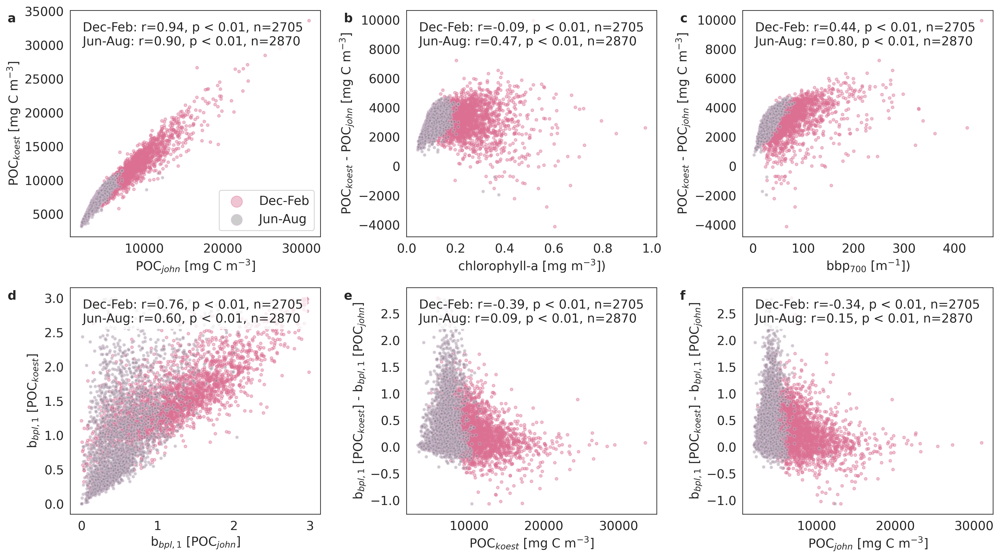

In [22]:
ds = ds_floats
ds = ds.sel(pressure=np.arange(0,200)).sum(dim='pressure')

mask = ds['month'].isin([12, 1, 2])
dw = ds.isel(n_prof=mask)

mask = ds['month'].isin([6, 7, 8])
dc = ds.isel(n_prof=mask)
plot_pairs = [
    ('poc_bs', 'poc_koest_bc'),
    ('bbp700_bs', 'poc_koest_bc - poc_bs'),
    ('chla', 'poc_koest_bc - poc_bs'),
    ('Par_b1_j', 'Par_b1_k'),
    ('poc_koest_bc', 'Par_b1_k - Par_b1_j'),
    ('poc_bs', 'Par_b1_k - Par_b1_j'),]


abcd = ['a','b','c','d','e','f','g','h']
fig, axs = plt.subplots(2, 3, figsize=(16, 9), dpi=300)

for i, (x_key, y_key) in enumerate(plot_pairs):
    row, col = divmod(i, 3)
    ax = axs[row, col]
    ax.text(-0.25, 0.99 ,abcd[i], transform=ax.transAxes, va='top', ha='left', fontsize=14, fontweight='bold')
    def get_data(d, expr):
        if '-' in expr:
            left, right = expr.split('-')
            return d[left.strip()] - d[right.strip()]
        return d[expr.strip()]

    x_dw = get_data(dw, x_key)
    y_dw = get_data(dw, y_key)
    x_dc = get_data(dc, x_key)
    y_dc = get_data(dc, y_key)

    ax.scatter(x_dw, y_dw, c='palevioletred', s=10, alpha=0.4, label='Dec-Feb',edgecolors=['palevioletred'])
    ax.scatter(x_dc, y_dc, c='grey', s=10, alpha=0.4,label='Jun-Aug',edgecolors=['thistle'])

    # Pearson correlation
    def safe_pearsonr(x, y):
        mask = np.isfinite(x) & np.isfinite(y)
        if np.sum(mask) > 2:
            r, p = pearsonr(x[mask], y[mask])
            return r, p, np.sum(mask)
        return np.nan, np.nan, 0

    r_dw, p_dw, n_dw = safe_pearsonr(np.array(x_dw), np.array(y_dw))
    r_dc, p_dc, n_dc = safe_pearsonr(np.array(x_dc), np.array(y_dc))

    stats_text = (f"Dec-Feb: r={r_dw:.2f}, p < 0.01, n={n_dw}\n"
                  f"Jun-Aug: r={r_dc:.2f}, p < 0.01, n={n_dc}")
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes,
            va='top', ha='left', fontsize=14,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
axs[0,0].legend(loc='lower right',markerscale=4)  

axs[0,0].set_ylabel('POC$_{koest}$ [mg C m$^{-3}$]')
axs[0,0].set_xlabel('POC$_{john}$ [mg C m$^{-3}$]')

axs[0,1].set_xlabel('chlorophyll-a [mg m$^{-3}$])')
axs[0,1].set_ylabel('POC$_{koest}$ - POC$_{john}$ [mg C m$^{-3}$]')

axs[0,2].set_xlabel('bbp$_{700}$ [m$^{-1}$])')
axs[0,2].set_ylabel('POC$_{koest}$ - POC$_{john}$ [mg C m$^{-3}$]')

axs[1,0].set_xlabel('b$_{bpl,1}$ [POC$_{john}$]')
axs[1,0].set_ylabel('b$_{bpl,1}$ [POC$_{koest}$]')

axs[1,1].set_ylabel('b$_{bpl,1}$ [POC$_{koest}$] - b$_{bpl,1}$ [POC$_{john}$]')
axs[1,1].set_xlabel('POC$_{koest}$ [mg C m$^{-3}$]')

axs[1,2].set_ylabel('b$_{bpl,1}$ [POC$_{koest}$] - b$_{bpl,1}$ [POC$_{john}$]')
axs[1,2].set_xlabel('POC$_{john}$ [mg C m$^{-3}$]')



plt.tight_layout()
plt.show()
